En este notebook voy a explorar y analizar como quedó el grafo armado. También lo voy a comparar con un subgrafo de primeKG.

# Importo librerías y cargo datos

In [134]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import networkx as nx
import igraph as ig 
from matplotlib_venn import venn3, venn2
import random
import plotly.io as pio

In [11]:
data_processed = "../../data/processed/"
data_interim = "../../data/interim/"

graph_node_data = pd.read_csv(data_processed+"graph_node_table.csv", index_col=0).reset_index(drop=True)
graph_edge_data = pd.read_csv(data_processed+"graph_edge_table.csv", index_col=0).reset_index(drop=True).rename(columns={"relation":"edge_type"}).astype({"edge_idx":"int64"})

prime_node_data = pd.read_csv(data_interim+"primekg_exploring_node_table.csv", index_col=0).reset_index(drop=True)
prime_edge_data = pd.read_csv(data_interim+"primekg_exploring_graph_edge_table.csv",index_col=0).reset_index(drop=True).rename(columns={"relation":"edge_type"})

seed = 16
random.seed(seed)
np.random.seed(seed)

/tmp/ipykernel_76838/3892007478.py:5: DtypeWarning: Columns (4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  graph_edge_data = pd.read_csv(data_processed+"graph_edge_table.csv", index_col=0).reset_index(drop=True).rename(columns={"relation":"edge_type"}).astype({"edge_idx":"int64"})


In [31]:
#esto es para forzar a plt a poner fondos blancos en las figuras aunque el tema del notebook sea oscuro
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
cmap = plt.get_cmap("tab10")
pio.templates.default = "seaborn"

sns.set_style("darkgrid", rc={'xtick.bottom': True})

In [12]:
display(graph_edge_data.head())
display(graph_node_data.head())

,edge_idx,a_idx,b_idx,a_id,b_id,edge_type,a_type,b_type,source,source_idx,score,YearInitial,YearFinal
0,0,3822,9703,3440,C0000737,GDA,gene/protein,disease,disgenet,26518,0.30,1997.0,1997.0
1,1,4762,9704,4547,C0000744,GDA,gene/protein,disease,disgenet,34865,0.80,1985.0,2019.0
2,2,524,9705,10683,C0000768,GDA,gene/protein,disease,disgenet,63589,0.33,2002.0,2011.0
3,3,1115,9705,1295,C0000768,GDA,gene/protein,disease,disgenet,11121,0.30,2008.0,2008.0
4,4,1154,9705,1317,C0000768,GDA,gene/protein,disease,disgenet,11360,0.30,2001.0,2001.0


,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH
0,0,1,gene/protein,A1BG,disgenet,NaN,NaN,NaN
1,1,10,gene/protein,NAT2,disgenet,NaN,NaN,NaN
2,2,100,gene/protein,ADA,disgenet,NaN,NaN,NaN
3,3,1000,gene/protein,CDH2,disgenet,NaN,NaN,NaN
4,4,10000,gene/protein,AKT3,disgenet,NaN,NaN,NaN


In [13]:
node_counts = dict(graph_node_data.node_type.value_counts())
node_counts["total"] = sum(node_counts.values())

edge_counts = dict(graph_edge_data.edge_type.value_counts())
edge_counts["total"] = sum(edge_counts.values())

display(pd.DataFrame.from_dict({"Número de nodos":node_counts}, orient="columns"))
display(pd.DataFrame.from_dict({"Número de enlaces":edge_counts}, orient="columns"))

,Número de nodos
disease,18548
gene/protein,16672
protein_complex,422
total,35642


,Número de enlaces
GDA,84038
PPI,150685
forms_complex,1888
parent_child_mondo,30419
total,267030


# Estudio capas
Extraje 3 subgrafos del grafo principal, según tipo de enlace: disease-disease, gda o ppi. Cada grafo contiene solo los nodos que están involucrados en enlaces de ese tipo.
El subgrafo gda es básicamente la red DisGeNET, disease-disease contiene tanto nodos de DisGeNET como de PrimeKG y ppi tiene nodos de hippie y disgenet.
Por un lado, quiero ver si logré una buena cobertura de DisGeNET al mergearla con estas redes: idealmente obtuve muchos enlaces que interconectan nodos de disgenet y la complementé con nodos nuevos.
Por otro lado, quiero estudiar como es cada red por separado y como se relacionan entre sí. 
También dividí primekg en dos grafos, para ver si la red gda y disease-disease que se obtiene solo usando primekg es similar a la que yo armé (y si tiene los mismos problemas que la mía).

Por último exporté todos los grafos en .gml para hacer visualizaciones en gephi

In [14]:
def attributes_from_pd(G:nx.Graph,df:pd.DataFrame,attributes:dict,indexcol):
    """Dados un grafo G y un dataframe df con atributos de sus nodos, especificamos los atributos
    que queremos agregar a los nodos en un diccionario con formato {nombre_columna:nombre_atributo}. 
    La función arma un diccionario con los atributos y el nombre que le queremos poner, indexado con el identificador de nodo que elegimos 
    y los asigna a los nodos del grafo"""
    for attribute,name in attributes.items():
        nx.set_node_attributes(G,pd.Series(df.set_index(indexcol)[attribute]).to_dict(),name)

def get_node_dict(G):
    return {node:data for (node,data) in list(G.nodes(data=True))}

Armo los grafos y asigno atributos

In [15]:
#Mi grafo
G = nx.from_pandas_edgelist(graph_edge_data,source="a_idx",target="b_idx", edge_attr=["edge_type","YearInitial","YearFinal","score","edge_idx"])
G_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","disgenet_type":"disgenet_type","diseaseClassMSH":"diseaseClassMSH","diseaseClassNameMSH":"diseaseClassNameMSH"}

edges_enfermedades = graph_edge_data[graph_edge_data.edge_type == "parent_child_mondo"]
nodos_enfermedades = graph_node_data[graph_node_data.node_type == "disease"]
DD = nx.from_pandas_edgelist(edges_enfermedades,source="a_idx",target="b_idx",edge_attr="edge_idx")
DD_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","disgenet_type":"disgenet_type","diseaseClassMSH":"diseaseClassMSH","diseaseClassNameMSH":"diseaseClassNameMSH"}

edges_proteinas = graph_edge_data[(graph_edge_data.edge_type == "PPI") | (graph_edge_data.edge_type == "forms_complex")]
nodos_proteinas = graph_node_data[(graph_node_data.node_type == "gene/protein") | (graph_node_data.node_type == "protein_complex")]
PPI = nx.from_pandas_edgelist(edges_proteinas,source="a_idx",target="b_idx",edge_attr="edge_idx")
PPI_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source"}

edges_gda = graph_edge_data[graph_edge_data.edge_type == "GDA"]
nodos_gda = graph_node_data[graph_node_data.node_source == "disgenet"]
GDA = nx.from_pandas_edgelist(edges_gda,source="a_idx",target="b_idx",edge_attr="edge_idx")
GDA_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","disgenet_type":"disgenet_type","diseaseClassMSH":"diseaseClassMSH","diseaseClassNameMSH":"diseaseClassNameMSH"}

for network,attr in zip([G,DD,PPI,GDA],[G_attributes,DD_attributes,PPI_attributes,GDA_attributes]):
    attributes_from_pd(network,graph_node_data,attr,"node_idx")

#Grafo de PrimeKG
PKG = nx.from_pandas_edgelist(prime_edge_data,source="a_index",target="b_index", edge_attr="edge_type")
PKG_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","mondo":"mondo","CUI":"CUI"}

pkg_edges_enfermedades = prime_edge_data[prime_edge_data.edge_type == "disease_disease"]
pkg_nodos_enfermedades = prime_node_data[prime_node_data.node_type == "disease"]
PKG_DD = nx.from_pandas_edgelist(pkg_edges_enfermedades,source="a_index",target="b_index",edge_attr="edge_type")
PKG_DD_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","mondo":"mondo","CUI":"CUI"}

pkg_edges_gda = prime_edge_data[prime_edge_data.edge_type == "gda"]
PKG_GDA = nx.from_pandas_edgelist(pkg_edges_gda,source="a_index",target="b_index",edge_attr="edge_type")
PKG_GDA_attributes = {"node_type":"node_type","node_name":"node_name","node_id":"node_id","node_source":"node_source","mondo":"mondo","CUI":"CUI"}

for network,attr in zip([PKG,PKG_DD,PKG_GDA],[PKG_attributes,PKG_DD_attributes,PKG_GDA_attributes]):
    attributes_from_pd(network,prime_node_data,attr,"node_index")

### Cantidad de nodos y enlaces de cada grafo

In [8]:
graphs = {"Mi Grafo":G, "Disease layer":DD, "Protein layer":PPI, "GDA": GDA, "PrimeKG":PKG, "PrimeKG disease layer":PKG_DD, "PrimeKG gda": PKG_GDA}
stats = {name:{"Número de nodos":graph.number_of_nodes(), "Número de enlaces":graph.number_of_edges()} for name,graph in graphs.items()}
display(pd.DataFrame(stats))

,Mi Grafo,Disease layer,Protein layer,GDA,PrimeKG,PrimeKG disease layer,PrimeKG gda
Número de nodos,35642,9664,15529,20884,26124,17008,14673
Número de enlaces,249840,15213,150589,84038,112605,32194,80411


### Overlap de nodos de cada sub-red

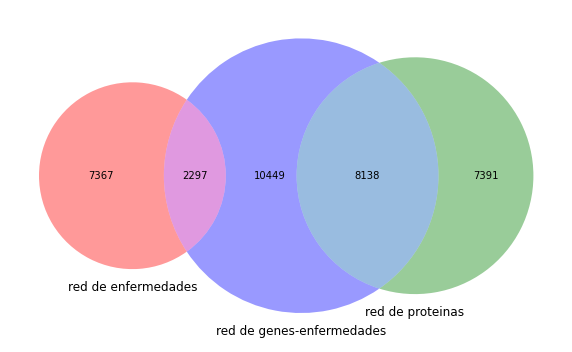

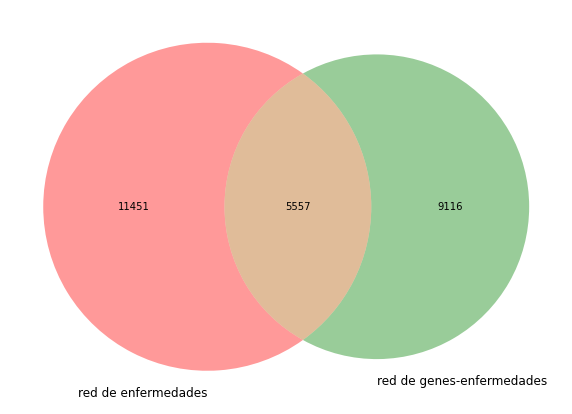

In [16]:
plt.figure(figsize=[10, 8])
plt.tight_layout()
plt.plot(title='Nodos en comun')

networks = {"red de enfermedades":DD, "red de proteinas":PPI, "red de genes-enfermedades":GDA}

(n1, g1), (n2, g2), (n3, g3) = networks.items()
s1, s2, s3 = set(g1), set(g2), set(g3)
'''para dos sets s,t python tiene las siguientes operaciones:
    union: s | t, interseccion: s & t, differencia: s - t
    Se usa esto para definir cuántos elementos hay en cada sección del diagrama'''
center = len(s1 & s2 & s3)
v1 = venn3([s1,s2,s3], set_labels=[n1,n2,n3])

plt.figure(figsize=[10, 8])
plt.tight_layout()
plt.plot(title='Nodos en comun')

networks = {"red de enfermedades":PKG_DD, "red de genes-enfermedades":PKG_GDA}

(n1, g1), (n2, g2) = networks.items()
s1, s2 = set(g1), set(g2)
'''para dos sets s,t python tiene las siguientes operaciones:
    union: s | t, interseccion: s & t, differencia: s - t
    Se usa esto para definir cuántos elementos hay en cada sección del diagrama'''
center = len(s1 & s2)
v2 = venn2([s1,s2], set_labels=[n1, n2])


Veo especificamente enfermedades

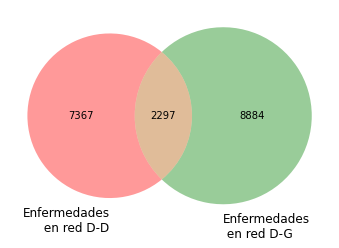

In [20]:
enfermedades_gda = nodos_gda[nodos_gda.node_type == "disease"]
s1,n1 = set(enfermedades_gda["node_idx"]),"Enfermedades\n en red D-G"
s2,n2 = set(DD), "Enfermedades\n en red D-D"

plt.figure()
v = venn2([s2,s1],set_labels=[n2,n1])
cobertura_mg = (len(s1&s2)*100)/len(s1)
plt.savefig("../../reports/overlap_disease_viejo.png", dpi=200)


# genes_kg = prime_node_data[prime_node_data.node_type == "gene"]
# s1,n1 = set(PKG_GDA),"gda gen+enf"
# s2,n2 = set(DD), "enfermedades en dd"
# s3,n3 = set(genes_kg["node_index"]), "genes gda"

# s4,n4 = (s1 - s3), "enfermedades en gda"

# plt.figure()
# v = venn2([s4,s2],set_labels=[n4,n2])

# cobertura_kg = (len(s4&s2)*100)/len(s4)

# print(f"Cobertura en mi grafo: {round(cobertura_mg)}%")
# print(f"Cobertura en PrimeKG: {round(cobertura_kg)}%")

# Distribución de grado

## Para red d-d, p-p y d-p

In [21]:
def get_degree_series(G,name):
    degrees = {n[0]:G.degree(n[0]) for n in G.nodes(data=True)}
    return pd.Series(degrees,name=name)

In [22]:
dd_degree = get_degree_series(DD,"degree_dd")
nodos_enfermedades = nodos_enfermedades.join(dd_degree)

fig_dd_degree = px.histogram(dd_degree, log_y=True, title="Distribución de grado - enfermedad-enfermedad")
fig_dd_degree.show()

In [23]:
ppi_degree = get_degree_series(PPI,"degree_pp")
nodos_proteinas = nodos_proteinas.join(ppi_degree)

fig_ppi_degree = px.histogram(ppi_degree, log_y=True, title="Distribución de grado - proteina-proteina")
fig_ppi_degree.show()

In [24]:
gda_degree = get_degree_series(GDA,"degree_gda")
nodos_gda = nodos_gda.join(gda_degree)

fig_gda_degree = px.histogram(gda_degree, log_y=True, title="Distribución de grado - gen-enfermedad")
fig_gda_degree.show()


Nodos en red GDA ordenados por grado de mayor a menor

In [25]:
nodos_gda.sort_values(by="degree_gda", ascending=False)

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda
9935,9935,C0006142,disease,Malignant neoplasm of breast,disgenet,disease,C04;C17,Neoplasms; Skin and Connective Tissue Diseases,1074
11206,11206,C0036341,disease,Schizophrenia,disgenet,disease,F03,Mental Disorders,883
10721,10721,C0023893,disease,"Liver Cirrhosis, Experimental",disgenet,disease,C23;C06,"Pathological Conditions, Signs and Symptoms; D...",774
10057,10057,C0009402,disease,Colorectal Carcinoma,disgenet,disease,C06;C04,Digestive System Diseases; Neoplasms,702
13143,13143,C0376358,disease,Malignant neoplasm of prostate,disgenet,disease,C04;C12,Neoplasms; Male Urogenital Diseases,616
...,...,...,...,...,...,...,...,...,...
13460,13460,C0432292,disease,Familial expansile osteolysis,disgenet,disease,C05,Musculoskeletal Diseases,1
13461,13461,C0432306,disease,Ichthyosis Bullosa of Siemens,disgenet,disease,C16;C17,"Congenital, Hereditary, and Neonatal Diseases ...",1
13462,13462,C0432307,disease,Ichthyosis hystrix of Curth-Macklin,disgenet,disease,NaN,NaN,1
13464,13464,C0432317,disease,"Epidermolysis bullosa simplex, Ogna type",disgenet,disease,C16;C17,"Congenital, Hereditary, and Neonatal Diseases ...",1


In [26]:
graph_node_data = pd.merge(graph_node_data,nodos_gda[["node_idx","degree_gda"]],how="left",left_on="node_idx",right_on="node_idx")
graph_node_data.degree_gda = graph_node_data.degree_gda.fillna(0)

graph_node_data = pd.merge(graph_node_data,nodos_proteinas[["node_idx","degree_pp"]],how="left",left_on="node_idx",right_on="node_idx")
graph_node_data.degree_pp = graph_node_data.degree_pp.fillna(0)

graph_node_data = pd.merge(graph_node_data,nodos_enfermedades[["node_idx","degree_dd"]],how="left",left_on="node_idx",right_on="node_idx")
graph_node_data.degree_dd = graph_node_data.degree_dd.fillna(0)

In [27]:
display(graph_node_data)

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd
0,0,1,gene/protein,A1BG,disgenet,NaN,NaN,NaN,2.0,10.0,0.0
1,1,10,gene/protein,NAT2,disgenet,NaN,NaN,NaN,39.0,5.0,0.0
2,2,100,gene/protein,ADA,disgenet,NaN,NaN,NaN,18.0,7.0,0.0
3,3,1000,gene/protein,CDH2,disgenet,NaN,NaN,NaN,28.0,21.0,0.0
4,4,10000,gene/protein,AKT3,disgenet,NaN,NaN,NaN,9.0,41.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
35637,35637,C3203657,disease,autoimmune retinopathy,primekg,NaN,NaN,NaN,0.0,0.0,4.0
35638,35638,C4510411,disease,growth hormone insensitivity with immune dysre...,primekg,NaN,NaN,NaN,0.0,0.0,2.0
35639,35639,C1970196,disease,adenosine kinase deficiency,primekg,NaN,NaN,NaN,0.0,0.0,2.0
35640,35640,C3272797,disease,colon serrated polyposis,primekg,NaN,NaN,NaN,0.0,0.0,1.0


## Comparo grado intra-capa e inter-capa

Quiero ver cuantos nodos me quedaron "aislados" en su capa, es decir, tienen enlaces con otra capa pero no están interconectados dentro de su capa:
K_intra_inter
K11 = enlaces inter e intra capa
K01 = solo enlaces inter capa
K10 = solo enlaces intra capa

In [17]:
def k_inter_intra(type,degree_type):
    #nodos con enlaces intercapa pero sin enlaces intra capa
    nodes_k01 = len(graph_node_data[(graph_node_data.node_type == type) & (graph_node_data.degree_gda != 0) & (graph_node_data[degree_type] == 0)])

    #nodos con enlaces intra capa y sin enlaces inter capa
    nodes_k10 = len(graph_node_data[(graph_node_data.node_type == type) & (graph_node_data.degree_gda == 0) & (graph_node_data[degree_type] != 0)])

    #nodos con enlaces intra e inter capa
    nodes_k11 = len(graph_node_data[(graph_node_data.node_type == type) & (graph_node_data.degree_gda != 0) & (graph_node_data[degree_type] != 0)])

    total = len(graph_node_data[graph_node_data.node_type == type])
    values = [(nodes_k11*100)/total, (nodes_k10*100)/total, (nodes_k01*100)/total]

    return (values)

In [18]:
k_prot = k_inter_intra("gene/protein","degree_pp")
k_enf = k_inter_intra("disease","degree_dd")

Text(0.5, 1.0, 'Nodos enfermedad')

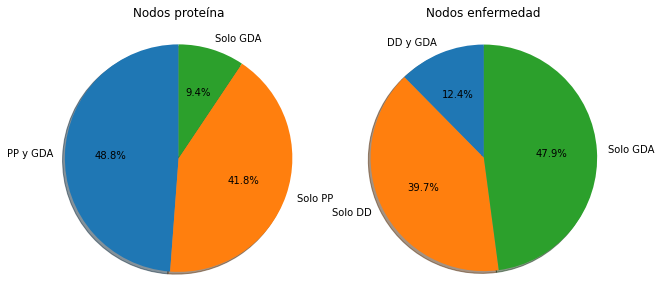

In [19]:
fig, ax = plt.subplots(1,2,figsize=(10,5))

ax[0].pie(k_prot, labels=["PP y GDA", "Solo PP", "Solo GDA"], autopct='%1.1f%%',shadow=True, startangle=90)
ax[0].axis('equal') 
ax[0].set_title("Nodos proteína")

ax[1].pie(k_enf, labels=["DD y GDA", "Solo DD", "Solo GDA"], autopct='%1.1f%%',shadow=True, startangle=90)
ax[1].axis('equal')
ax[1].set_title("Nodos enfermedad")

Distribución de grado para enfermedades -> genes y para genes -> enfermedades (para nodos con enlaces gda, es decir, no cuento grado=0)

In [20]:
fig_pd_degree = px.histogram(graph_node_data[(graph_node_data.node_type == "gene/protein") & (graph_node_data.degree_gda !=0)]["degree_gda"], log_y=True, title="Distribución de grado: nodos gen -> nodos enfermedad")
fig_pd_degree.show()

In [21]:
fig_dp_degree = px.histogram(graph_node_data[(graph_node_data.node_type == "disease") & (graph_node_data.degree_gda !=0)]["degree_gda"], log_y=True, title="Distribución de grado: nodos enfermedad -> nodos gen")
fig_dp_degree.show()

# Evolución temporal

Los enlaces de DisGeNET cuentan con la información de en qué año se registró por primera vez evidencia que respalde la asociación gen-enfermedad y en qué año se registró por última vez. 
Usando estos datos voy a estudiar la evolución temporal de la red

In [28]:
nan_count = edges_gda.YearInitial.isna().value_counts()
print(f"Hay {nan_count[True]} enlaces sin fecha, para este analisis los saco")

#hay enlaces sin fecha, para este analisis los saco
gda_year_data = edges_gda.dropna()

print(f"Me quedo con {gda_year_data.shape[0]} enlaces")
gda_year_data.astype({'YearInitial': 'int','YearFinal':'int'})

Hay 4383 enlaces sin fecha, para este analisis los saco
Me quedo con 79655 enlaces


,edge_idx,a_idx,b_idx,a_id,b_id,edge_type,a_type,b_type,source,source_idx,score,YearInitial,YearFinal
0,0,3822,9703,3440,C0000737,GDA,gene/protein,disease,disgenet,26518,0.30,1997,1997
1,1,4762,9704,4547,C0000744,GDA,gene/protein,disease,disgenet,34865,0.80,1985,2019
2,2,524,9705,10683,C0000768,GDA,gene/protein,disease,disgenet,63589,0.33,2002,2011
3,3,1115,9705,1295,C0000768,GDA,gene/protein,disease,disgenet,11121,0.30,2008,2008
4,4,1154,9705,1317,C0000768,GDA,gene/protein,disease,disgenet,11360,0.30,2001,2001
...,...,...,...,...,...,...,...,...,...,...,...,...,...
84032,84032,4742,20883,4509,C4757950,GDA,gene/protein,disease,disgenet,34556,0.30,2009,2009
84033,84033,5041,20883,498,C4757950,GDA,gene/protein,disease,disgenet,4598,0.30,2013,2013
84034,84034,5268,20883,513,C4757950,GDA,gene/protein,disease,disgenet,4620,0.30,2018,2018
84035,84035,5309,20883,514,C4757950,GDA,gene/protein,disease,disgenet,4622,0.30,2010,2010


Evolución temporal de la evidencia sobre asociaciones gen-enfermedad en DisGeNET, por fecha de primer evidencia registrada y fecha de última evidencia registrada. Grafico el histograma y también el acumulado en el tiempo.

In [45]:
gda_year_data.YearInitial.max()

2020.0

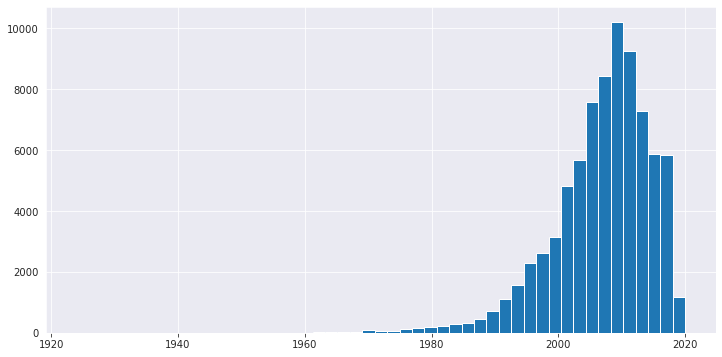

In [61]:
fig, ax = plt.subplots(figsize=(12,6))

plot = ax.hist(gda_year_data.YearInitial, bins=np.linspace(1924,2020))
# ax.set_yscale("log")
ax.tick_params(axis='y', which="both")

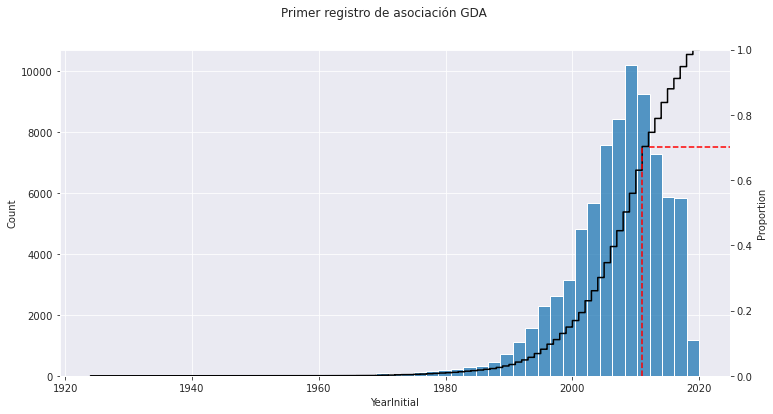

In [102]:
fig, ax = plt.subplots(figsize=(12,6))
ax2 = ax.twinx()
sns.histplot(gda_year_data,x="YearInitial",ax=ax, bins=np.linspace(1924,2020))
fig.suptitle("Primer registro de asociación GDA")

sns.ecdfplot(gda_year_data, x="YearInitial",ax=ax2, color="black", linestyle = "-")
ax2.grid(False)

ax2.axvline(2011,0,0.7,color="red", linestyle="--")
ax2.axhline(0.7,0.88,1,color="red", linestyle="--")
# fig.savefig("../../reports/analisis_comunidades/distribucion_tamaños.png", dpi=200)

fig.savefig("../../reports/year_initial.png",dpi=200)

In [23]:
fig_initial = px.histogram(gda_year_data, x="YearInitial", title="Year Initial",color_discrete_sequence=['#e377c2'])
fig_initial.show()
fig_final = px.histogram(gda_year_data, x="YearFinal", title="Year Final",color_discrete_sequence=['#e377c2'])
fig_final.show()

fig_initial_cdf = px.ecdf(gda_year_data, x="YearInitial", title="CDF Year Initial",color_discrete_sequence=['#e377c2'])
fig_initial_cdf.show()

fig_final_cdf = px.ecdf(gda_year_data, x="YearFinal", title="CDF Year Final",color_discrete_sequence=['#e377c2'])
fig_final_cdf.show()

Busco el año en el cual se acumuló determinado porcentaje de la información total

In [103]:
def ecdf_threshold(sample:np.ndarray,threshold:float) -> int:
    """Dada la columna de años como array y un corte de porcentaje acumulado,
    devuelve el año que corresponde al porcentaje acumulado en la curva ecdf"""
    x = np.sort(sample)
    y = np.arange(1,len(x)+1)/float(len(x))

    cut = int(x[np.where(y>threshold)][0])
    return cut

def ecdf_data(sample:np.ndarray) -> tuple:
    x = np.sort(sample)
    y = np.arange(1,len(x)+1)/float(len(x))
    return (x,y)

In [104]:
threshold = 0.7
initial = gda_year_data['YearInitial'].values
final = gda_year_data['YearFinal'].values

initial_cut = ecdf_threshold(initial,threshold)
final_cut = ecdf_threshold(final,threshold)

print(f"Año correspondiente a acumulado {round(threshold*100)}%:\nInitial: {initial_cut}\nFinal: {final_cut}")

Año correspondiente a acumulado 70%:
Initial: 2011
Final: 2017


Estudio la cantidad de enlaces que acumuló una enfermedad a lo largo del tiempo (estoy usando YearInitial, es decir, la fecha de la primera vez que se registró evidencia de una asociación)

{'Node name': 'IFNA2',
 'num_enlaces': 170,
 'Oldest': 1986,
 'Newest': 2016,
 'Pendiente': 5.67}

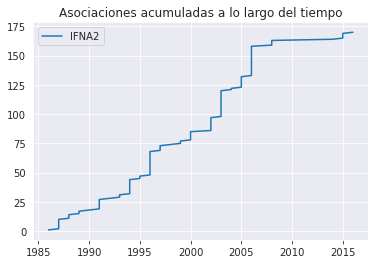

In [152]:
def k_temporal(node_index,plot=True,color=cmap(0)):

    nodetype = nodos_gda[nodos_gda.node_idx == node_index]["node_type"].values[0]

    if nodetype == "gene/protein":
        dates = gda_year_data[gda_year_data.a_idx == node_index]["YearInitial"].values
    else:
        dates = gda_year_data[gda_year_data.b_idx == node_index]["YearInitial"].values

    num_evidencia = len(dates)
    oldest = np.min(dates)
    newest = np.max(dates)

    x = np.sort(dates)
    y = np.arange(1,len(x)+1)

    if oldest-newest == 0:
        pendiente = 0
    else:
        pendiente = (num_evidencia-0)/(newest-oldest)
    stats = {"Node name": nodos_gda[nodos_gda.node_idx == node_index].node_name.values[0], "num_enlaces": num_evidencia, "Oldest": int(oldest), "Newest": int(newest), "Pendiente":round(pendiente,2)}

    if plot:
        plt.plot(x,y,label=stats["Node name"], color=color)
        # plt.plot(x, pendiente*(x-oldest), "--",color=color, alpha=0.5)
        plt.title(f"Asociaciones acumuladas a lo largo del tiempo")
        plt.legend()
        

    return stats

ejemplo = 3822
temp_data = k_temporal(ejemplo)
temp_data

Hago este análisis para todos los nodos, guardo la información de primer y último enlace registrado y la pendiente.

In [114]:
temporal_data = {}
nodos_gen = np.unique(gda_year_data.a_idx.values)
nodos_enf = np.unique(gda_year_data.b_idx.values)

for nodo in np.concatenate((nodos_gen,nodos_enf)):
    temporal_data[nodo] = k_temporal(nodo,plot=False)

In [115]:
temporal_df = pd.DataFrame(temporal_data).T.sort_values(by="Pendiente")
display(temporal_df)

,Node name,num_enlaces,Oldest,Newest,Pendiente
7016,ARHGEF28,1,2013,2013,0
16546,Complement Component 7 Deficiency,1,1989,1989,0
16545,"Microphthalmia, Syndromic 5",1,1997,1997,0
16544,"MICROPHTHALMIA, SYNDROMIC 6 (disorder)",1,1986,1986,0
16543,"Neuronal Ceroid Lipofuscinosis, Congenital",1,1995,1995,0
...,...,...,...,...,...
11102,Prostatic Neoplasms,615,1990,2019,21.21
2822,SIN3A,24,2015,2016,24.0
11206,Schizophrenia,882,1982,2016,25.94
10721,"Liver Cirrhosis, Experimental",774,1993,2019,29.77


Nodos con pendiente alta: 
Hay mucha evidencia acumulada a lo largo de un período extenso de tiempo, por ej, "Schizophrenia" tiene 882 enlaces acumulados entre 1982 y 2019.
También puede haber menos enlaces pero acumulados en un período corto de tiempo, como "Cholestasis, Extrahepatic" que tiene 32 enlaces acumulados entre 2017 y 2018, lo que muestra una alta actividad en la investigación de asociaciones genéticas con esa enfermedad en ese período de tiempo.

Se podría pensar como una métrica de "que tan activa está la investigación" sobre ese nodo?

Comparo las curvas para algunas enfermedades de k alto y bajo

Hay algunos casos que habría que considerar, por ejemplo, si un nodo tiene 10 enlaces pero son todos del mismo año la pendiente es 0. Si un nodo tiene un único enlace la pendiente también es cero. En este sentido la métrica no está tan buena, habría que ver como manejar esos casos. 
Por ahí sumandole el número de enlaces o algo asi?

In [156]:
temporal_df.sort_values(by="coef_temporal", ascending=False)

,Node name,num_enlaces,Oldest,Newest,Pendiente,coef_temporal
10721,"Liver Cirrhosis, Experimental",774,1993,2019,29.77,198.721019
11206,Schizophrenia,882,1982,2016,25.94,176.637788
11102,Prostatic Neoplasms,615,1990,2019,21.21,136.879393
9935,Malignant neoplasm of breast,742,1982,2019,20.05,133.205525
14584,"Mammary Neoplasms, Human",515,1991,2019,18.39,115.490514
...,...,...,...,...,...,...
596,LILRB1,1,2015,2015,0,0.069315
19237,"EPILEPTIC ENCEPHALOPATHY, EARLY INFANTILE, 24",1,2014,2014,0,0.069315
20608,Familial isolated trichomegaly,1,2014,2014,0,0.069315
20609,Distal 17p13.3 microdeletion syndrome,1,2011,2011,0,0.069315


In [145]:
#las 5 más altas
higher_k = temporal_df.sort_values(by="coef_temporal", ascending=False)[0:5]

#las 5 más bajas (son 0)
zero_k = temporal_df[0:5]

#las 5 más bajas con más de 5 enlaces 
lowest_k = temporal_df[temporal_df["num_enlaces"] > 5][0:5]

#5 más bajas con más de 5 enlaces y pendiente distinta de 0
lowest_k_2 = temporal_df[(temporal_df["num_enlaces"] > 5) & (temporal_df.Pendiente !=0)][0:5]

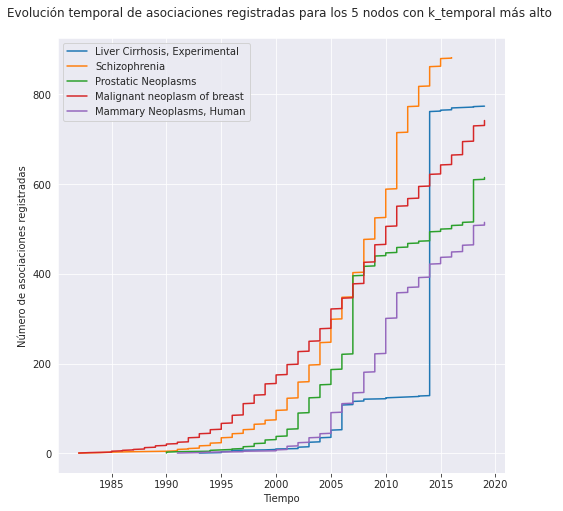

In [157]:
plt.figure(figsize=(8,8))
for i,node in enumerate(higher_k.index.values):
    k_temporal(node,plot=True,color=cmap(i))
    plt.title("Evolución temporal de asociaciones registradas para los 5 nodos con k_temporal más alto \n")
    plt.xlabel("Tiempo")
    plt.ylabel("Número de asociaciones registradas")

plt.savefig("../../reports/ktemporal.png",dpi=200)

$\log{(enlaces)\cdot(pendiente + \varepsilon)}$ →así peso el número de enlaces en la métrica y con el epsilon puedo contar las pendientes nulas

In [111]:
def metrica_tiempo(enlaces,pendiente,epsilon):
    ktiempo = np.log(enlaces)*(pendiente + epsilon)
    return ktiempo

In [129]:
temporal_df["num_enlaces"].values.min()

1

In [137]:
np.log(temporal_df.num_enlaces.astype("float"))

7016     0.000000
16546    0.000000
16545    0.000000
16544    0.000000
16543    0.000000
           ...   
11102    6.421622
2822     3.178054
11206    6.782192
10721    6.651572
9901     3.465736
Name: num_enlaces, Length: 19876, dtype: float64

In [160]:
temporal_df["coef_temporal"] = np.round(np.log(temporal_df.num_enlaces.astype("float"))*(temporal_df.Pendiente + 0.1),2)

TypeError: loop of ufunc does not support argument 0 of type float which has no callable rint method

# Comunidades

In [18]:
def particion_a_diccionario(Red_igraph,particion_igraph):
  particion_dict = {}
  for cluster in range(len(particion_igraph)):
    for nodo in Red_igraph.vs(particion_igraph[cluster])['name']:
      particion_dict.update({nodo:cluster})
  return particion_dict

def particiones(G):
    dict = {}
    G_igraph = ig.Graph.TupleList(G.edges(), directed=False)
    comunidades_infomap  = G_igraph.community_infomap()
    dict_comunidades_infomap = particion_a_diccionario(G_igraph,comunidades_infomap)
    modularidad_infomap = G_igraph.modularity(comunidades_infomap)
    dict['Infomap'] = {'comunidades' : comunidades_infomap, 'diccionario':dict_comunidades_infomap, 'modularidad':modularidad_infomap}

    #LA FUNCIÓN COMMUNITY_MULTILEVEL DE IGRAPH UTILIZA EL ALGORITMO LOUVAIN
    G_igraph = ig.Graph.TupleList(G.edges(), directed=False)
    comunidades_louvain = G_igraph.community_multilevel()
    dict_comunidades_louvain = particion_a_diccionario(G_igraph,comunidades_louvain)
    modularidad_louvain = G_igraph.modularity(comunidades_louvain)
    dict['Louvain'] = {'comunidades' : comunidades_louvain, 'diccionario':dict_comunidades_louvain, 'modularidad':modularidad_louvain}
    return dict

In [19]:
comunidades_dd = particiones(DD)
#comunidades_ppi = particiones(ppi)
#%%
col_infomap = pd.Series(comunidades_dd['Infomap']['diccionario'],name="comunidades_infomap")
col_louvain = pd.Series(comunidades_dd['Louvain']['diccionario'],name="comunidades_louvain")

nx.set_node_attributes(DD,comunidades_dd['Infomap']['diccionario'],name="comunidad_infomap")
nx.set_node_attributes(DD,comunidades_dd['Louvain']['diccionario'],name="comunidad_louvain")

graph_node_data = pd.merge(graph_node_data,col_infomap,left_on="node_idx",right_index=True, how="left")
graph_node_data = pd.merge(graph_node_data,col_louvain,left_on="node_idx",right_index=True, how="left")


In [21]:
tamaños_infomap = col_infomap.value_counts()
tamaños_louvain = col_louvain.value_counts()

fig_dist_infomap = px.histogram(col_infomap, title="Distribución de tamaños de clusters - Infomap").update_layout(xaxis_title="Tamaño")
fig_dist_infomap.show()

fig_dist_louvain = px.histogram(col_louvain, title="Distribución de tamaños de clusters - Louvain").update_layout(xaxis_title="Tamaño")
fig_dist_louvain.show()

stats = {"Infomap":{"Num_clusters":len(tamaños_infomap),"Modularidad":round(comunidades_dd["Infomap"]["modularidad"],2)}, "Louvain":{"Num_clusters":len(tamaños_louvain),"Modularidad":round(comunidades_dd["Louvain"]["modularidad"],2)}}

display(pd.DataFrame(stats))

,Infomap,Louvain
Num_clusters,862.00,189.00
Modularidad,0.72,0.82


Métrica para ver si una partición está incluida en la otra:

Coeficiente de inclusión


No tengo muchas enfermedades en la red que tengan clase de mesh en los datos:

In [20]:
graph_node_data[graph_node_data.diseaseClassMSH.notna() & graph_node_data.degree_dd != 0]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
9704,9704,C0000744,disease,Abetalipoproteinemia,disgenet,disease,C16;C18,"Congenital, Hereditary, and Neonatal Diseases ...",1.0,0.0,5.0,0.0,0.0
9713,9713,C0001080,disease,Achondroplasia,disgenet,disease,C16;C05,"Congenital, Hereditary, and Neonatal Diseases ...",1.0,0.0,3.0,59.0,16.0
9715,9715,C0001125,disease,"Acidosis, Lactic",disgenet,phenotype,C18,Nutritional and Metabolic Diseases,6.0,0.0,3.0,65.0,1.0
9719,9719,C0001193,disease,Apert syndrome,disgenet,disease,C16;C05,"Congenital, Hereditary, and Neonatal Diseases ...",2.0,0.0,2.0,80.0,2.0
9720,9720,C0001197,disease,Acrodermatitis,disgenet,disease,C16;C17,"Congenital, Hereditary, and Neonatal Diseases ...",3.0,0.0,2.0,48.0,11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20202,20202,C4511138,disease,Adult-onset chronic progressive external ophth...,disgenet,phenotype,C23;C18;C11;C05;C10,"Pathological Conditions, Signs and Symptoms; N...",2.0,0.0,4.0,10.0,1.0
20212,20212,C4518338,disease,Wolfram-like syndrome,disgenet,disease,C16;C11;C10,"Congenital, Hereditary, and Neonatal Diseases ...",1.0,0.0,2.0,213.0,1.0
20213,20213,C4518356,disease,MiT family translocation renal cell carcinoma,disgenet,disease,C04;C13;C12,Neoplasms; Female Urogenital Diseases and Preg...,7.0,0.0,1.0,846.0,173.0
20214,20214,C4518774,disease,Joubert syndrome with Jeune asphyxiating thora...,disgenet,disease,C16;C13;C11;C17;C05;C12,"Congenital, Hereditary, and Neonatal Diseases ...",2.0,0.0,3.0,85.0,16.0


In [35]:
def nombre_mesh(meshclass):
    nombre = pd.unique(graph_node_data[graph_node_data.diseaseClassMSH == meshclass]["diseaseClassNameMSH"])
    return nombre

mesh_names = {mesh:nombre_mesh(mesh) for mesh in pd.unique(graph_node_data[~graph_node_data.diseaseClassMSH.isna()].diseaseClassMSH)}

Me armo una tabla de correspondencia clase mesh con nombre de clase mesh, porque en el dataset están separados por comas y es medio dificil de manejar así.

In [36]:
mesh_col = graph_node_data[~graph_node_data.diseaseClassMSH.isna()]['diseaseClassMSH'].str.split(';').explode()
meshname_col = graph_node_data[~graph_node_data.diseaseClassMSH.isna()]['diseaseClassNameMSH'].str.split(';').explode()
mesh_df = pd.concat([mesh_col,meshname_col], axis=1).drop_duplicates(subset=["diseaseClassMSH"]).reset_index(drop=True)

In [37]:
def mesh_from_cluster(cluster_id,method):
    if method == "infomap":
        cluster_nodes = graph_node_data[(graph_node_data.comunidades_infomap == cluster_id) & (graph_node_data.diseaseClassMSH.notna())]
        cluster_nodes_noclass = len(graph_node_data[(graph_node_data.comunidades_infomap == cluster_id) & (graph_node_data.diseaseClassMSH.isna())])
        total_nodes = len(graph_node_data[graph_node_data.comunidades_infomap == cluster_id])
    elif method == "louvain":
        cluster_nodes = graph_node_data[(graph_node_data.comunidades_louvain == cluster_id) & (graph_node_data.diseaseClassMSH.notna())]
        cluster_nodes_noclass = len(graph_node_data[(graph_node_data.comunidades_louvain == cluster_id) & (graph_node_data.diseaseClassMSH.isna())])
        total_nodes = len(graph_node_data[graph_node_data.comunidades_louvain == cluster_id])

    mesh_classes = cluster_nodes.diseaseClassMSH.values
    classes = []
    for value in mesh_classes:
        split = value.split(";")
        for mesh_class in split:
            classes.append(mesh_class)
    fig = px.histogram(classes, title=f"Clases de Mesh representadas en el cluster {cluster_id}").update_layout(xaxis_title="Mesh Class")
    fig.show()
    #print(f"Este cluster tiene {total_nodes} nodos, de los cuales {cluster_nodes_noclass} no tienen clase mesh. \nFueron contados {len(cluster_nodes)} nodos")
    print(f"Nodos en gráfico: {len(cluster_nodes)} \nNodos totales cluster: {total_nodes} \nNodos sin clase mesh: {cluster_nodes_noclass}")

Poner en la leyenda de plotly el nombre de la clase así es más legible

*No se puede hacer esto 

In [39]:
mesh_from_cluster(37,"infomap")

Nodos en gráfico: 52 
Nodos totales cluster: 301 
Nodos sin clase mesh: 249


In [88]:
mesh_df.sort_values(by="diseaseClassMSH")

,diseaseClassMSH,diseaseClassNameMSH
7,C01,Infections
11,C04,Neoplasms
4,C05,Musculoskeletal Diseases
12,C06,Digestive System Diseases
19,C07,Stomatognathic Diseases
16,C08,Respiratory Tract Diseases
23,C09,Otorhinolaryngologic Diseases
9,C10,Nervous System Diseases
17,C11,Eye Diseases
5,C12,Male Urogenital Diseases


## Intento de wordcloud para ver a ojo si las comunidadades tienen algún sentido, ya que las clases de MESH todavía no las puedo usar, salió raro

In [22]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
filter = STOPWORDS.update(["syndrome","disease","disorder","type","due","deficiency","congenital","familial"])
def wordcloud_from_cluster(cluster_id):
    cluster_nodes = graph_node_data[graph_node_data.comunidades_infomap == cluster_id]
    titles = cluster_nodes.node_name.values
    words = []
    for title in titles:
        split = title.split()
        for word in split:
            words.append(word)
    wordcloud = WordCloud(stopwords=filter , width = 1000, height = 500).generate(" ".join(words))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

116


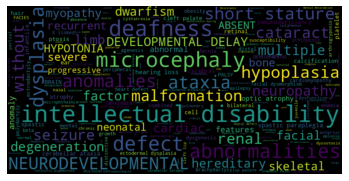

37


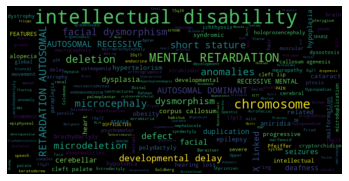

117


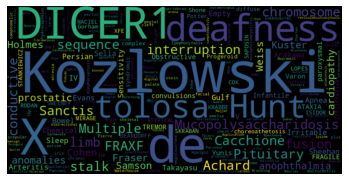

64


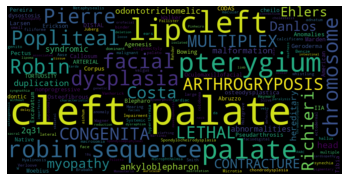

28


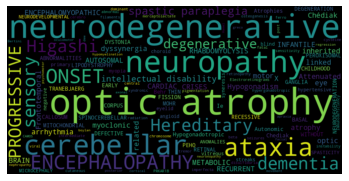

In [23]:
for cluster in tamaños_infomap[0:5].index.values:
    print(cluster)
    wordcloud_from_cluster(cluster)

# Especificidad

La idea es ver si un gen/enfermedad se relaciona con muchos nodos diferentes (baja especificidad) o no (alta especificidad). También compararlo con comunidades.

# Saco hubs

Voy a ir removiendo los nodos de grado muy alto de la red disease-disease y viendo como cambia el tamaño de la componente gigante

In [91]:
def gc_size(G):
    """Calcula el tamaño de la componente más grande del grafo"""
    return len(max(nx.connected_components(G), key=len))

In [92]:
disease_hubs = graph_node_data[graph_node_data.node_type == "disease"].sort_values(by="degree_dd", ascending=False)
highest_ranking = disease_hubs[0:10].node_idx.values

Estos son los 10 nodos enfermedad con más enlaces enfermedad-enfermedad:

*hasta multiple congenital anomalies puedo remover seguro

In [93]:
disease_hubs[0:10]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
29999,29999,C0019247,disease,Mendelian disease,primekg,NaN,NaN,NaN,0.0,0.0,907.0,116.0,26.0
28362,28362,CN225415,disease,syndromic intellectual disability,primekg,NaN,NaN,NaN,0.0,0.0,366.0,37.0,2.0
29078,29078,C0039082,disease,syndromic disease,primekg,NaN,NaN,NaN,0.0,0.0,342.0,117.0,5.0
33004,33004,CN228396,disease,multiple congenital anomalies/dysmorphic syndr...,primekg,NaN,NaN,NaN,0.0,0.0,279.0,37.0,2.0
34323,34323,CN205639,disease,genetic nervous system disorder,primekg,NaN,NaN,NaN,0.0,0.0,244.0,37.0,2.0
35174,35174,C0410787,disease,hereditary connective tissue disorder,primekg,NaN,NaN,NaN,0.0,0.0,147.0,64.0,16.0
34479,34479,CN206426,disease,syndromic genetic deafness,primekg,NaN,NaN,NaN,0.0,0.0,132.0,213.0,2.0
31018,31018,C0265388,disease,autosomal recessive disease,primekg,NaN,NaN,NaN,0.0,0.0,105.0,72.0,16.0
34312,34312,CN205539,disease,neurometabolic disease,primekg,NaN,NaN,NaN,0.0,0.0,84.0,1.0,1.0
28335,28335,C0265385,disease,autosomal dominant disease,primekg,NaN,NaN,NaN,0.0,0.0,79.0,365.0,16.0


In [94]:
G2 = G.copy()
sizes = [gc_size(G2)]
for hub in highest_ranking:
    G2.remove_node(hub)
    sizes.append(gc_size(G2))

fig = px.scatter(x=np.arange(len(sizes)),y=sizes,width=800, height=400, title="Tamaño de componente gigante al remover los 10 primeros hubs enfermedad").update_layout(xaxis_title="Ranking de nodo", yaxis_title="Tamaño CG")
fig.show()

print(f"Al remover el hub más importante pierdo {sizes[0]-sizes[1]} nodos de la componente gigante \nAl remover los primeros 10, en total, pierdo {sizes[0] - sizes[-1]}")

Al remover el hub más importante pierdo 687 nodos de la componente gigante 
Al remover los primeros 10, en total, pierdo 1044


Al remover esos nodos pierdo algunas asociaciones que no son disease-disease. Creo que esto pasa porque originalmente no estaban en la componente gigante, sino que son asociaciones GDA "sueltas", que al agregar enlaces d-d había conectado a la componente gigante. Esto me hace pensar que tengo que darle más importancia a la conectividad de la red para tratar de incluir más nodos en la GC. También tiene que ver con el tema de predecir GDA para nodos sin GDA previos: si están incluidos en la CG, puedo hacer predicciones igual, sino no.

In [77]:
lost_nodes = list(max(nx.connected_components(G), key=len) - max(nx.connected_components(G2), key=len))
graph_node_data[graph_node_data.node_idx.isin(lost_nodes)]

NameError: name 'G2' is not defined

# Distancias intercapa

Para los nodos que no tienen enlaces inter-capa, quiero ver cual es la distancia mínima que tienen a un nodo de otra capa. Es decir, si el nodo no se conecta directamente con la otra capa, cuantos pasos tengo que dar a través de nodos de la misma capa para llegar a la otra. 

Uso igraph porque hace más rápido estas cuentas y porque me deja pasarle listas de nodos para calcular las distancias.

In [96]:
nodos_intracapa = graph_node_data[graph_node_data.degree_gda == 0]
enf_intracapa = nodos_intracapa[(nodos_intracapa.node_type == "disease")].node_idx.values
gen_intracapa = nodos_intracapa[(nodos_intracapa.node_type == "gene/protein")].node_idx.values
complejos_intracapa = nodos_intracapa[nodos_intracapa.node_type == "protein_complex"].node_idx.values
#all_genes = graph_node_data[graph_node_data.node_type == "gene/protein"].node_idx.values
#all_enf = graph_node_data[graph_node_data.node_type == "disease"].node_idx.values
gen_intercapa = graph_node_data[(graph_node_data.degree_gda != 0) & (graph_node_data.node_type == "gene/protein")].node_idx.values
enf_intercapa = graph_node_data[(graph_node_data.degree_gda != 0) & (graph_node_data.node_type == "disease")].node_idx.values

Armo una versión igraph de mi grafo. Como igraph usa otra forma de indexar los nodos, me armo diccionarios para "traducir" entre mi nomenclatura y la de igraph.

In [97]:
G_igraph = ig.Graph.TupleList(G.edges(), directed=False)

#Tengo que "traducir" los ids de mi grafo a ids de igraph
vid2name = dict(zip(range(G_igraph.vcount()), G_igraph.vs['name']))
name2vid = dict((name, vid) for vid, name in vid2name.items())
gen_intercapa_vid = [name2vid[gen] for gen in gen_intercapa]
enf_intercapa_vid = [name2vid[enf] for enf in enf_intercapa]

Estas celdas tardan un poquito en correr

In [98]:
results_enf = {}
for enf in enf_intracapa:
    igraph_id = name2vid[enf]
    results_enf[enf] = min(G_igraph.shortest_paths(igraph_id,gen_intercapa_vid,mode="out")[0])

In [99]:
results_gen = {}
for gen in gen_intracapa:
    igraph_id = name2vid[gen]
    results_gen[gen] = min(G_igraph.shortest_paths(igraph_id,enf_intercapa_vid,mode="out")[0])

In [100]:
results_complex = {}
for com in complejos_intracapa:
    igraph_id = name2vid[com]
    results_complex[com] = min(G_igraph.shortest_paths(igraph_id,enf_intercapa_vid,mode="out")[0])

Combino todo en un dataframe para visualizar los resultados.

A los nodos totalmente desconectados de la otra capa les asigno valor negativo, a los nodos que tienen un enlace con la otra capa les asigno distancia 1.

In [101]:
shortest_interlayer_length = pd.Series(pd.concat([pd.Series(results_enf, dtype="float64"),pd.Series(results_gen, dtype="float64"), pd.Series(results_complex, dtype="float64")]),name="Shortest_interlayer_length")
#le asigno valor negativo a los nodos totalmente desconectados de la otra capa
shortest_interlayer_length = shortest_interlayer_length.apply(lambda x: -1 if x == float("inf") else x)
node_interlayer_data = graph_node_data.join(shortest_interlayer_length, on="node_idx")
node_interlayer_data.loc[(graph_node_data["degree_gda"] != 0), 'Shortest_interlayer_length'] = 1

In [102]:
node_interlayer_data

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain,Shortest_interlayer_length
0,0,1,gene/protein,A1BG,disgenet,NaN,NaN,NaN,2.0,10.0,0.0,NaN,NaN,1.0
1,1,10,gene/protein,NAT2,disgenet,NaN,NaN,NaN,39.0,5.0,0.0,NaN,NaN,1.0
2,2,100,gene/protein,ADA,disgenet,NaN,NaN,NaN,18.0,7.0,0.0,NaN,NaN,1.0
3,3,1000,gene/protein,CDH2,disgenet,NaN,NaN,NaN,28.0,21.0,0.0,NaN,NaN,1.0
4,4,10000,gene/protein,AKT3,disgenet,NaN,NaN,NaN,9.0,41.0,0.0,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35637,35637,C3203657,disease,autoimmune retinopathy,primekg,NaN,NaN,NaN,0.0,0.0,4.0,152.0,11.0,2.0
35638,35638,C4510411,disease,growth hormone insensitivity with immune dysre...,primekg,NaN,NaN,NaN,0.0,0.0,2.0,436.0,6.0,3.0
35639,35639,C1970196,disease,adenosine kinase deficiency,primekg,NaN,NaN,NaN,0.0,0.0,2.0,23.0,1.0,2.0
35640,35640,C3272797,disease,colon serrated polyposis,primekg,NaN,NaN,NaN,0.0,0.0,1.0,421.0,4.0,3.0


Como ya había visto en "comparo grado inter e intra capa", la mayoría de los nodos G y D tienen enlaces "intercapa" o GDA. No existen los enlaces "GDA" para complejos de proteínas.

Observando todos los tipos de nodo juntos veo que (sacando los nodos "intercapa" que tienen distancia =1) la mayoría tiene distancia k=2 o k=3, pocos casos tienen distancia k > 3. Esto me indica una conectividad razonable entre capas y sugiere usar k=3 capas como máximo en la red de predicción.

In [103]:
interlayer_fig = px.histogram(node_interlayer_data["Shortest_interlayer_length"], title="All types and cases")
interlayer_fig.show()

Para enfermedades, curiosamente hay más nodos a distancia k=3 que k=2. Nuevamente sugiere considerar k=3 capas en la red de predicción. En cuanto a los nodos con distancias k>3, infiero que se trata de "cadenas" de nodos. Una inspección del grafo en Gephi me ayudó a reforzar esta idea, y además vimos que estas "cadenas" se tratan de clasificaciones cada vez más específicas de enfermedades, quizás no muy informativas para el problema que quiero resolver.

In [104]:
interlayer_fig = px.histogram(node_interlayer_data.loc[graph_node_data["node_type"] == "disease", "Shortest_interlayer_length"], title="Diseases")
interlayer_fig.show()

In [41]:
node_counts

{'disease': 18548,
 'gene/protein': 16672,
 'protein_complex': 422,
 'total': 35642}

En este caso (sacando intercapa) la mayoría de los nodos está a distancia k=2 de la otra capa. La red de gen-gen tiene una buena conectividad con la capa de enfermedades.

In [105]:
interlayer_fig = px.histogram(node_interlayer_data.loc[graph_node_data["node_type"] == "gene/protein", "Shortest_interlayer_length"], title="Genes")
interlayer_fig.show()

Al igual que los nodos gen, los nodos complejo están mayormente a distancia k=2 de la capa enfermedades. Esto quiere decir que los complejos que agregué mayormente se enlazaron con genes que tienen enlaces GDA, están "cerca" de nodos enfermedad.

In [106]:
interlayer_fig = px.histogram(node_interlayer_data.loc[graph_node_data["node_type"] == "protein_complex", "Shortest_interlayer_length"], title="Complejos")
interlayer_fig.show()

# Análisis de texto de comunidades

Por un lado está la partición infomap, tengo criterios de similaridad de genes compartidos o similaridad TF-IDF. La idea es ver si los elementos de los clusters infomap son similares entre si segun estos criterios. 

Para cada cluster infomap, calcular la similaridad media de sus componentes y calcular una distribución de estos mismos valores para pares tomados al azar. 
Estandarizar: (z = x- <x>)/sigma -> sobre el sampleo nulo. También se puede ver el p-value.
Grafico z en función del tamaño.

Zgen vs ZIDF y tamaño-> tamaño del cluster y veo todo junto

En primer lugar voy a tratar de asociar terminos biomédicos a comunidades. Para esto voy a tratar cada comunidad como un "documento" y al conjunto de los documentos de todas las comunidades como un "corpus". Con esto voy a hacer un análisis TF-IDF y ver los términos con score TF-IDF más alto.

Además, quiero ver si una comunidad tiene muchos términos asociados con puntaje medio-bajo, versus una con pocos términos y puntaje alto. Para esto se me ocurrió medir la entropía de las distribuciones (normalizadas).

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import text
from sklearn.metrics.pairwise import cosine_similarity
custom_stopwords = ["disease","syndrome","familial","congenital","deficiency","disorder"]
stop_words = text.ENGLISH_STOP_WORDS.union(custom_stopwords)

## Preprocessing
Armado del corpus y el "documento" de cada cluster y preprocesado de texto. 

No remuevo ni separo las palabras con "-", porque al ser vocabulario biomédico, hay muchos términos que llevan guiones. Por ejemplo: 'peutz-jeghers syndrome', 'bannayan-riley-ruvalcaba syndrome', 't-cell'. Por eso en sklern uso un tokenizer custom, para no perder estos casos.

In [25]:
def remove_symbols(data):
    symbols = "!\"\'#$%&()*+./:;<=>?@[\]^_`{|},~\n"
    for i in symbols:
        data = np.char.replace(data, i, ' ')
    return data

def doc_to_bow(data):
    bow = []
    for text in data:
        split = text.split()
        for word in split:
            bow.append(word)
    return bow

def filter_stopwords(bow):
    return [word for word in bow if not word in stop_words]

def cluster_as_document(cluster_id,cluster_algorithm,join_titles=True):
    titles = graph_node_data.loc[graph_node_data[cluster_algorithm] == cluster_id, "node_name"].values.astype(str)
    titles = np.char.lower(titles)
    titles = remove_symbols(titles)
    if join_titles:
        document = " ".join(titles)
    else:
        document = titles
    return document

vectorizer = TfidfVectorizer(tokenizer = lambda document: document.split() , stop_words=stop_words)
def get_tfidf_df(vectorizer,corpus,ids,df=True):
    X = vectorizer.fit_transform(corpus)
    if df:
        #X = pd.DataFrame(X.toarray(), index=ids, columns=vectorizer.get_feature_names_out())
        X = pd.DataFrame.sparse.from_spmatrix(X, index=ids, columns=vectorizer.get_feature_names_out())
    return X

def wordcloud_from_tfidf(df,cluster_id):
    wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(df.loc[cluster_id])
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [26]:
infomap_ids = pd.unique(graph_node_data.loc[~graph_node_data.comunidades_infomap.isna(),"comunidades_infomap"])
louvain_ids = pd.unique(graph_node_data.loc[~graph_node_data.comunidades_louvain.isna(),"comunidades_louvain"])

corpus_infomap = [cluster_as_document(cluster_id,"comunidades_infomap") for cluster_id in infomap_ids]
corpus_louvain = [cluster_as_document(cluster_id,"comunidades_louvain") for cluster_id in louvain_ids]

tfidf_infomap = get_tfidf_df(vectorizer,corpus_infomap,infomap_ids).sparse.to_dense()
tfidf_louvain = get_tfidf_df(vectorizer,corpus_louvain,louvain_ids).sparse.to_dense()

Agregar frecuencia de "duplas" de palabras.
Filtrado: ver términos que aparecen en un solo "documento" *ver

In [46]:
tfidf_infomap

,-,-globulin,0,000,1,1-antitrypsin,1-like,1-q23,1-q32,10,...,zinc,zinc-responsive,zollinger-ellison,zonal,zone,zoonosis,zoonotic,zoster,zunich,zygomatic
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0
59.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0
65.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0
80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0
48.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0
494.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0
767.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.57734,0.57734,0.0,0.0,0.0
848.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.0


In [27]:
tfidf_louvain.memory_usage().sum()*0.000001

10.612727999999999

In [28]:
tfidf_infomap.memory_usage().sum()*0.000001

48.403023999999995

In [45]:
tamaños_infomap

116    807
37     301
117    143
64      69
28      54
      ... 
746      2
742      2
741      2
738      2
861      2
Name: comunidades_infomap, Length: 862, dtype: int64

Tomo de ejemplo un cluster según infomap. Voy a ver los títulos de enfermedades que aparecen y después los términos con score top 5 tf-idf

In [29]:
ejemplo = 421
cluster_as_document(ejemplo,"comunidades_infomap",False)

array(['peutz-jeghers syndrome', 'bannayan-riley-ruvalcaba syndrome',
       'cronkhite-canada syndrome', 'juvenile polyposis syndrome',
       'juvenile polyposis hereditary hemorrhagic telangiectasia syndrome  disorder ',
       'familial intestinal polyposis',
       'sessile serrated polyposis cancer syndrome',
       'generalized juvenile polyposis juvenile polyposis coli',
       'peutz-jeghers syndrome', 'hereditary mixed polyposis syndrome',
       'intestinal polyposis syndrome', 'intestinal polyposis syndrome',
       'hyperplastic polyposis syndrome', 'juvenile polyposis of infancy',
       'colon serrated polyposis'], dtype='<U76')

In [30]:
fig = px.bar(tfidf_infomap.loc[ejemplo].sort_values(ascending=False)[0:5])
fig.show()

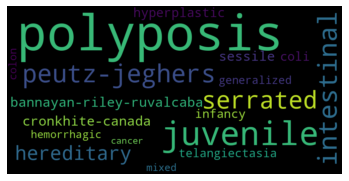

In [101]:
wordcloud_from_tfidf(tfidf_infomap,ejemplo)

### Entropía de distribuciones de términos por clusters

Viendo los resultados para distintos tamaños de clusters ví que en algunos casos hay términos con importancia más "marcada", mientras que en otros no se puede distinguir términos más importantes que otros. En el primer caso, unos pocos términos tienen una frecuencia alta y el resto es más baja. En el segundo, muchos términos tienen una frecuencia media.

Para "medir" esto se me ocurrió normalizar y calcular la entropía de la distribución, pero no sé si estará bien...
La idea es que si las frecuencias dan muy parejas (como equiprobables), tf idf no me dice nada y es como si hubiera juntado términos random -> entropía alta
Si hay pocas frecuencias muy marcadas -> entropía baja

???

In [44]:
np.log(800)

6.684611727667927

In [31]:
fig1 = px.bar(tfidf_infomap.loc[116].sort_values(ascending=False)[0:20])
fig1.show()

fig2 = px.bar(tfidf_infomap.loc[421].sort_values(ascending=False)[0:20])
fig2.show()

In [72]:
import scipy.stats
from scipy.stats import entropy
def get_entropy(series,normalized=True):
    """Calcula la entropía para una columna de valores de pandas. 
    La extrae como un array y la normaliza para que la suma sea 1 y después calcula la entropía.
    La normalizo por la entropía máxima posible, que sería la distribución uniforme pi=1/(b-a) para valores entre b y a. 
    En este caso es simplemente 1/ el largo del array"""
    values = series.values
    arr = values/(np.sum(values))
    max_entropy = entropy(np.ones(len(arr))/len(arr), base=2)
    if normalized:
        S = round(entropy(arr, base=2)/max_entropy,2)
    else:
        S = round(entropy(arr, base=2))
    return S

Miro un cluster grande y uno más chico de ejemplo

In [149]:
tamaños_infomap

116    807
37     301
117    143
64      69
28      54
      ... 
746      2
742      2
741      2
738      2
861      2
Name: comunidades_infomap, Length: 862, dtype: int64

0.79


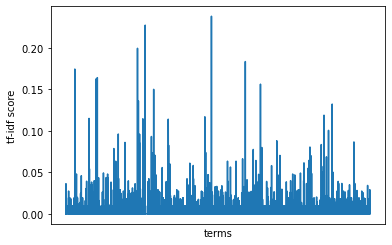

In [33]:
big_cluster = 116
fig, ax = plt.subplots(figsize=(6,4))
ax.set_xticks([])
tfidf_infomap.loc[big_cluster].plot(ax=ax, xlabel='terms', ylabel='tf-idf score')
print(get_entropy(tfidf_infomap.loc[big_cluster]))

0.27


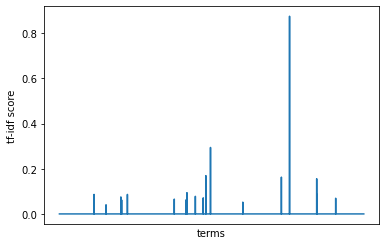

In [197]:
fig, ax = plt.subplots(figsize=(6,4))
ax.set_xticks([])
tfidf_infomap.loc[ejemplo].plot(ax=ax, xlabel='terms', ylabel='tf-idf score')
print(get_entropy(tfidf_infomap.loc[ejemplo]))

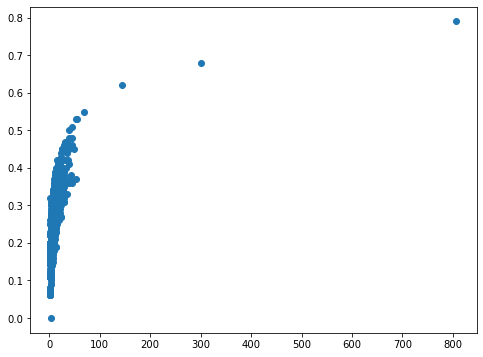

In [73]:
entropias_segun_tamaño = [get_entropy(tfidf_infomap.loc[cluster]) for cluster in tamaños_infomap.index]
plt.figure(figsize=(8,6))
plt.scatter(tamaños_infomap.values, entropias_segun_tamaño)

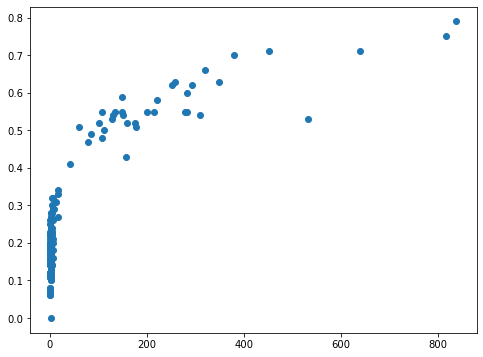

In [200]:
entropias_segun_tamaño = [get_entropy(tfidf_louvain.loc[cluster]) for cluster in tamaños_louvain.index]
plt.figure(figsize=(8,6))
plt.scatter(tamaños_louvain.values, entropias_segun_tamaño)

In [77]:
entropias_segun_tamaño = [get_entropy(tfidf_infomap.loc[cluster],True) for cluster in tamaños_infomap.index]

In [62]:
clusters_5070 = tamaños_infomap[(tamaños_infomap > 50) & (tamaños_infomap < 70)].index.values

In [63]:
for cluster in clusters_5070:
    fig1 = px.bar(tfidf_infomap.loc[cluster].sort_values(ascending=False)[0:20])
    fig1.show()

Ver n-grams (n=2,n=3) dentro de cada cluster. Y reporto n grams por clusters

In [64]:
id = clusters_5070[-1]
graph_node_data[graph_node_data.comunidades_infomap == id]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
28950,28950,C1334566,disease,malignant cardiac germ cell tumor,primekg,NaN,NaN,NaN,0.0,0.0,1.0,609.0,50.0
28987,28987,C0349621,disease,malignant pineal area germ cell neoplasm,primekg,NaN,NaN,NaN,0.0,0.0,8.0,609.0,50.0
28988,28988,C1334612,disease,malignant pineal area germ cell neoplasm,primekg,NaN,NaN,NaN,0.0,0.0,8.0,609.0,50.0
29059,29059,C1332606,disease,brain germinoma,primekg,NaN,NaN,NaN,0.0,0.0,2.0,609.0,50.0
29477,29477,C1332880,disease,central nervous system germ cell tumor,primekg,NaN,NaN,NaN,0.0,0.0,9.0,609.0,50.0
29537,29537,C1333769,disease,malignant gastric germ cell tumor,primekg,NaN,NaN,NaN,0.0,0.0,3.0,609.0,50.0
29538,29538,C1334584,disease,malignant gastric germ cell tumor,primekg,NaN,NaN,NaN,0.0,0.0,3.0,609.0,50.0
29539,29539,C1334581,disease,extragonadal germ cell cancer,primekg,NaN,NaN,NaN,0.0,0.0,12.0,609.0,50.0
29710,29710,C1335420,disease,pineal region yolk sac tumor,primekg,NaN,NaN,NaN,0.0,0.0,2.0,609.0,50.0
29714,29714,C1332221,disease,adult yolk sac tumor,primekg,NaN,NaN,NaN,0.0,0.0,1.0,609.0,50.0


## Métrica de similaridad TF-IDF nodo a nodo

Ahora trato cada nodo como "documento" y uso el vector que obtengo para medir similaridad. El conjunto de todos los nombres va a ser el corpus.

In [37]:
def tfidf_similarity(corpus,ids,vectorizer,df=True):
    scores = get_tfidf_df(vectorizer,corpus,ids,False)
    similarity_matrix = cosine_similarity(scores,scores,False)
    if df:
        similarity_matrix = pd.DataFrame.sparse.from_spmatrix(similarity_matrix, index=ids, columns=ids)
    return similarity_matrix

In [35]:
corpus = graph_node_data[graph_node_data.node_type == "disease"].node_name.values.astype(str)
ids = graph_node_data[graph_node_data.node_type == "disease"].index.values
corpus = np.char.lower(corpus)
corpus = remove_symbols(corpus)

algoritmo = "comunidades_infomap"
cluster = 421
nodos_cluster = graph_node_data[graph_node_data[algoritmo] == cluster].index.values

Obtuve una matriz de (nodos x palabras)

Para cada cluster veo la similaridad media entre nodos con esta métrica.

Similaridad = similaridad coseno de vectores tf idf

Lo calculé para todos los nodos, usé sparse matrices para que no sea tan pesado

Me falta tomarle la media y compararlo con el jaccard de genes

In [38]:
tfidf_similarity_matrix = tfidf_similarity(corpus,ids,vectorizer)

In [39]:
tfidf_similarity_matrix.loc[nodos_cluster,nodos_cluster]

,11047,12349,12806,13078,15095,17229,19977,31859,31860,32573,33009,33010,33122,34350,35640
11047,1.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
12349,0.0,1.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
12806,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
13078,0.0,0.0,0.0,1.000000,0.627530,0.554178,0.337130,0.870629,0.0,0.493389,0.554178,0.554178,0.485247,0.778210,0.402362
15095,0.0,0.0,0.0,0.627530,1.000000,0.347763,0.211559,0.546346,0.0,0.477196,0.347763,0.347763,0.304507,0.488350,0.252494
17229,0.0,0.0,0.0,0.554178,0.347763,1.000000,0.328954,0.482483,0.0,0.481424,1.000000,1.000000,0.473480,0.431267,0.392605
19977,0.0,0.0,0.0,0.337130,0.211559,0.328954,1.000000,0.293515,0.0,0.292871,0.328954,0.328954,0.288038,0.262358,0.613296
31859,0.0,0.0,0.0,0.870629,0.546346,0.482483,0.293515,1.000000,0.0,0.429559,0.482483,0.482483,0.422470,0.677533,0.350308
31860,1.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
32573,0.0,0.0,0.0,0.493389,0.477196,0.481424,0.292871,0.429559,0.0,1.000000,0.481424,0.481424,0.421543,0.383960,0.349539


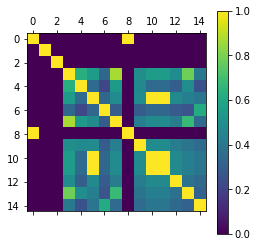

In [40]:
plt.matshow(tfidf_similarity_matrix.loc[nodos_cluster,nodos_cluster])
plt.colorbar()

# Filtro ***

In [86]:
nombres_repetidos = graph_node_data[graph_node_data.duplicated(subset="node_name", keep=False)]

In [88]:
nombres_repetidos.node_type.value_counts()

disease            757
gene/protein       342
protein_complex      3
Name: node_type, dtype: int64

Complejos

In [89]:
nombres_repetidos[nombres_repetidos.node_type == "protein_complex"]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
27896,27896,SIGNOR-C133,protein_complex,PP2Ca_R1A_Bd,signor,NaN,NaN,NaN,0.0,3.0,0.0,NaN,NaN
27897,27897,SIGNOR-C134,protein_complex,PP2Ca_R1A_Bd,signor,NaN,NaN,NaN,0.0,3.0,0.0,NaN,NaN
28139,28139,SIGNOR-C382,protein_complex,MCC,signor,NaN,NaN,NaN,0.0,4.0,0.0,NaN,NaN


In [90]:
nombres_repetidos[nombres_repetidos.node_name == "MCC"]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
4565,4565,4163,gene/protein,MCC,disgenet,NaN,NaN,NaN,12.0,49.0,0.0,NaN,NaN
28139,28139,SIGNOR-C382,protein_complex,MCC,signor,NaN,NaN,NaN,0.0,4.0,0.0,NaN,NaN


Genes

In [95]:
nombres_repetidos[nombres_repetidos.node_type == "gene/protein"]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
127,127,100506658,gene/protein,OCLN,disgenet,NaN,NaN,NaN,18.0,5.0,0.0,NaN,NaN
133,133,100507436,gene/protein,MICA,disgenet,NaN,NaN,NaN,3.0,0.0,0.0,NaN,NaN
162,162,100750225,gene/protein,PCAT1,disgenet,NaN,NaN,NaN,2.0,0.0,0.0,NaN,NaN
166,166,100820829,gene/protein,MYZAP,disgenet,NaN,NaN,NaN,5.0,1.0,0.0,NaN,NaN
1248,1248,1394,gene/protein,CRHR1,disgenet,NaN,NaN,NaN,38.0,9.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27813,27813,100526767,gene/protein,CHMP3,signor,NaN,NaN,NaN,0.0,2.0,0.0,NaN,NaN
27842,27842,100527963,gene/protein,PMF1,signor,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN
27844,27844,246721,gene/protein,POLR2J2,signor,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN
27845,27845,548644,gene/protein,POLR2J2,signor,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN


En este caso lo que pasó es que HIPPIE está usando una nomenclatura obsoleta:
![Captura de pantalla del buscador de entrez gene. Dice que ese id está obsoleto y ahora lo cambiaron por uno nuevo](figures/gen_obsoleto.png "Captura de pantalla del buscador de entrez gene") .

Voy a ver si son varios asi. Si veo que hay un patrón... voy a mergear los nodos en uno solo

In [96]:
nombres_repetidos[nombres_repetidos.node_name == "MICA"]

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
133,133,100507436,gene/protein,MICA,disgenet,NaN,NaN,NaN,3.0,0.0,0.0,NaN,NaN
25991,25991,4276,gene/protein,MICA,hippie,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN


In [100]:
nombres_repetidos[nombres_repetidos.node_source == "hippie"].sort_values(by="node_name")

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
22867,22867,60489,gene/protein,ABC3G,hippie,NaN,NaN,NaN,0.0,5.0,0.0,NaN,NaN
22866,22866,200316,gene/protein,ABC3G,hippie,NaN,NaN,NaN,0.0,13.0,0.0,NaN,NaN
21018,21018,11217,gene/protein,AKAP2,hippie,NaN,NaN,NaN,0.0,6.0,0.0,NaN,NaN
21019,21019,445815,gene/protein,AKAP2,hippie,NaN,NaN,NaN,0.0,6.0,0.0,NaN,NaN
22196,22196,276,gene/protein,AMY1,hippie,NaN,NaN,NaN,0.0,30.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27443,27443,317754,gene/protein,NaN,hippie,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN
27469,27469,574537,gene/protein,NaN,hippie,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN
27503,27503,3538,gene/protein,NaN,hippie,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN
27545,27545,100142659,gene/protein,NaN,hippie,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN


In [101]:
nombres_repetidos[(nombres_repetidos.node_source == "hippie") & ~nombres_repetidos.node_name.isna()].sort_values(by="node_name")

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
22867,22867,60489,gene/protein,ABC3G,hippie,NaN,NaN,NaN,0.0,5.0,0.0,NaN,NaN
22866,22866,200316,gene/protein,ABC3G,hippie,NaN,NaN,NaN,0.0,13.0,0.0,NaN,NaN
21018,21018,11217,gene/protein,AKAP2,hippie,NaN,NaN,NaN,0.0,6.0,0.0,NaN,NaN
21019,21019,445815,gene/protein,AKAP2,hippie,NaN,NaN,NaN,0.0,6.0,0.0,NaN,NaN
22196,22196,276,gene/protein,AMY1,hippie,NaN,NaN,NaN,0.0,30.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25949,25949,442867,gene/protein,VCY2,hippie,NaN,NaN,NaN,0.0,2.0,0.0,NaN,NaN
25520,25520,284677,gene/protein,VSIG8,hippie,NaN,NaN,NaN,0.0,35.0,0.0,NaN,NaN
25521,25521,391123,gene/protein,VSIG8,hippie,NaN,NaN,NaN,0.0,35.0,0.0,NaN,NaN
27436,27436,100287429,gene/protein,ZNF84,hippie,NaN,NaN,NaN,0.0,1.0,0.0,NaN,NaN


Me traje 75 nodos de hippie sin nombre????!
Yendo a la página de Hippie, a mano, los recupero. No sé que pasa con esto

In [103]:
graph_node_data[graph_node_data.node_name.isna()].node_source.value_counts()

hippie    75
Name: node_source, dtype: int64

Diseases

In [105]:
nombres_repetidos[nombres_repetidos.node_type == "disease"].sort_values(by="node_name")

,node_idx,node_id,node_type,node_name,node_source,disgenet_type,diseaseClassMSH,diseaseClassNameMSH,degree_gda,degree_pp,degree_dd,comunidades_infomap,comunidades_louvain
19877,19877,C4305140,disease,12q14 microdeletion syndrome,disgenet,phenotype,C23;C16;C17;C05;C10;C19;F03;F01,"Pathological Conditions, Signs and Symptoms; C...",2.0,0.0,4.0,368.0,2.0
34546,34546,CN206727,disease,12q14 microdeletion syndrome,primekg,NaN,NaN,NaN,0.0,0.0,4.0,368.0,2.0
33512,33512,CN202168,disease,16p11.2p12.2 microduplication syndrome,primekg,NaN,NaN,NaN,0.0,0.0,1.0,464.0,2.0
33511,33511,C4518821,disease,16p11.2p12.2 microduplication syndrome,primekg,NaN,NaN,NaN,0.0,0.0,1.0,464.0,2.0
33513,33513,CN202173,disease,16p13.11 microduplication syndrome,primekg,NaN,NaN,NaN,0.0,0.0,1.0,464.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
28436,28436,C3665609,disease,xerophthalmia,primekg,NaN,NaN,NaN,0.0,0.0,2.0,127.0,5.0
28435,28435,C0043349,disease,xerophthalmia,primekg,NaN,NaN,NaN,0.0,0.0,2.0,127.0,5.0
34695,34695,C0043398,disease,yellow fever,primekg,NaN,NaN,NaN,0.0,0.0,1.0,629.0,23.0
34694,34694,C0043395,disease,yellow fever,primekg,NaN,NaN,NaN,0.0,0.0,1.0,629.0,23.0


In [107]:
nombres_repetidos[nombres_repetidos.node_type == "disease"].node_source.value_counts()

primekg     736
disgenet     21
Name: node_source, dtype: int64